# 1)Does basic house information reflect house's description?

In this assignment we will perform a clustering analysis of house announcements in Rome from Immobiliare.it.
Our goal is to implement two clustering and compare the results we get. We  need to create two datasets and each of them will be filled by data that we scraped.

So, first things first, we import the libraries we need to perform our analysis.

In [2]:
import os
from bs4 import BeautifulSoup
import pandas as pd
import requests
from requests import get
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from math import log
from math import sqrt
import re
from collections import Counter
from time import sleep
from random import randint
from warnings import warn
import numpy as np
from IPython.core.display import clear_output
from time import time
import sklearn
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.metrics import jaccard_similarity_score
import matplotlib.pyplot as plt
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import pickle

In [3]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Giumas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## Scraping

 We have to create our dataset. The website that we will scrape is: from immobiliare.it. In particular, we want to retrieve at least 10k announcements starting from the site. We will need to do some pre-processing on the text we will have after scraping the site and we will do it by using the Beautiful Soup library to parse the html. 

In [43]:
pages = [str(i) for i in range(1,1400)]

In [5]:
# Lists to store the scraped data int
prices = []
locals_ = []
surfaces = []
bathrooms = []
floors = []
descriptions = []

In [6]:
# Preparing the monitoring of the loop (THIS IS NOT TO BE RUN!!DON'T RUN IT)
start_time = time()
requests = 0

for page in pages:
    url = ('https://www.immobiliare.it/vendita-case/roma/?criterio=rilevanza&pag=' +page)
    response = get(url)
    # Pause the loop
    sleep(randint(8,15))
    # Monitor the requests
    requests += 1
    elapsed_time = time() - start_time
    print('Request:{}; Frequency: {} requests/s'.format(requests, requests/elapsed_time))
    clear_output(wait = True)
    # Throw a warning for non-200 status codes
    if response.status_code != 200:
        warn('Request: {}; Status code: {}'.format(requests, response.status_code))
    # Break the loop if the number of requests is greater than expected
    if requests > 10000:
        warn('Number of requests was greater than expected.')  
        break
    # Parse the content of the request with BeautifulSoup
    page_html = BeautifulSoup(response.text, 'html.parser')
    try :
    # Select all the houses contained from a single page
        house_containers = page_html.find_all('div', class_ = 'listing-item_body--content')
        for house in house_containers:
            house.find('li', class_ = '"lif__item lif__pricing')
            locals_surface_bathrooms = house.findAll('span', class_="text-bold")
            filtering_floor= house.findAll('abbr', class_="text-bold im-abbr") 
    # If the house has all info that need us (price, locals, surface, bathroom and floor) then extract:
        if len(locals_surface_bathrooms) == 3 :
            if len(filtering_floor) >= 1: 
                floor = house.find('abbr', class_="text-bold im-abbr").text.strip()
                if  floor != 'A' and floor != 'S' and floor != 'T':  #don't take houses with A,S,T value for the floor

        # The price
                          price = house.find('li', class_="lif__item lif__pricing").text.strip()
                          #if condition needs us to know if price has got also old price (in this case price has % character)
                          if '%' in price : 
                              price = house.find('div').text.strip()
                          price = re.sub('[€] ', '', price)
                          price = re.sub('[.]', '', price)
                          price = int(price)
                          prices.append(price)

        #the number of locals, surface (m^2), and number of bathrooms
                          local_ = locals_surface_bathrooms[0].text.strip()
                          if '+' in local_:
                              local_ = re.sub('[+]', '', local_)
                          locals_.append(int(local_))
                          surface = locals_surface_bathrooms[1].text.strip()
                          surfaces.append(int(surface))
                          bathroom = locals_surface_bathrooms[2].text.strip()
                          if '+' in bathroom:
                              bathroom = re.sub('[+]', '', bathroom)
                          bathrooms.append(int(bathroom))
        
        #the floor
                          floors.append(int(floor))

        # the description
                          description = house.find('p', class_="descrizione__truncate").text.strip()
                          descriptions.append(description)
    except :
        pass

Request:9; Frequency: 0.07572251066934307 requests/s


After scraping the site, we make all the arrays of the same lenght to work better with them.

In [7]:
prices2 = prices[:10000]
locals2 = locals_[:10000]
surfaces2 = surfaces[:10000]
bathrooms2 = bathrooms[:10000]
floors2 = floors[:10000]
descriptions2 = descriptions[:10000]

Then we create our datasets, that will be in the form of two matrices.
The first matrix will have this format: $ m_{i,j}= $ *value* where $ i \in ({announcement_1,...announcement_n})$   and $ j \in  ({price, locali, superficie,bagni piano }_n )  $ n is the number of the announcements. we have prices, locals, surface, bathroom and floor . The second matrix will have this format $ m_{i,j}={tfIdf}_{i,j}$:  where $ i \in { (announcements_1,...,announcement_n)}$  and $ i \in {(word_1,....,word_m)}$ . $n$ is the number of the announcements and $m$ is the cardinality of the vocabulary.

In [44]:
info_matrix = pd.DataFrame({'price':prices2,
                           'locals':locals2,
                           'surface':surfaces2,
                           'bathroom':bathrooms2,
                           'floor':floors2})
info_matrix.to_csv("firstMatrix.csv")
info_matrix1 = pd.read_csv("firstMatrix.csv")

After creating the first  matrix we display it. looks good!

In [10]:
info_matrix

,price,locals,surface,bathroom,floor
0,225000,2,50,1,1
1,395000,5,130,2,1
2,3700000,5,250,3,5
3,850000,5,175,2,5
4,279000,3,110,1,1
5,520000,3,105,2,1
6,269000,3,87,2,3
7,1050000,5,235,3,3
8,1800000,5,250,3,3
9,1650000,5,220,3,4


To work better, we clean our data defining this function that helps us doing it. 

In [11]:
def clening_description(description):  # use all the techniques to remove unwanted items from words
    
    tokenizer = RegexpTokenizer(r'\w+')
    ps = PorterStemmer()
    # Remove "\\n" and replace with a space
    description = description.replace("\\n", " ")
    # Convert everything to lowercase
    description = description.lower()
    # Removing punctuation
    description = tokenizer.tokenize(description)
    # Removing stopwords
    description = [word for word in description if word not in stopwords.words('italian')]
    # No integers
    description = [x for x in description if not (x.isdigit() or x[0].isdigit())]
    return description

We apply this function to our data 

In [12]:
cleaned_descriptions = []
for description in descriptions:
    cleaned_description = clening_description(description)
    cleaned_descriptions.append(' '.join(cleaned_description))  

In [13]:
corpus = [''.join(x).split(' ') for x in cleaned_descriptions]
new_corpus = [x for l in corpus for x in l]
#all words present in all descriptions

In [15]:
count_corpus = Counter(new_corpus)
count_corpus= dict(count_corpus.most_common())

final_dict = {str(i+1):x for i,x in enumerate(count_corpus)}
final_dict_inv = {str(x):(i+1) for i,x in enumerate(count_corpus)}

Now we create the second matrix inmplementing the procedure for the inverted index

In [17]:
indx = {}
for n,document in enumerate(cleaned_descriptions):
    new_document = []
    for word in document.split(' '):
        new_document.append(final_dict_inv[str(word)])
    indx[str(n+1)] = new_document 
    
inv_indx = {str(i):[] for i in list(final_dict.keys())}
for word in list(final_dict.keys()):
    for i in range(len(indx)):
        if int(word) in indx[str(i+1)]:
            inv_indx[word].append(i+1)

In [18]:
houses_count= len(info_matrix)

In [19]:
inv_indx2 = {i:[] for i in list(final_dict.keys())}
for word in list(final_dict.keys()):
    for i,l in enumerate(list(indx.values())):
        if int(word) in l:
            tf = l.count(int(word))/len(l)
            id_f = log(houses_count/len(inv_indx[word]))
            inv_indx2[word].append((i+1,tf*id_f))

We then display the second matrix as well

In [20]:
inv_indx2

{'1': [(2, 0.0028632746269346577),
  (5, 0.001597405844500388),
  (7, 0.0025292259204589477),
  (9, 0.0030050208955947895),
  (10, 0.0010996634436778033),
  (11, 0.0020788158250347514),
  (12, 0.0029183376005295554),
  (13, 0.0023711493004302635),
  (14, 0.0016317586583606116),
  (15, 0.0032287990473944014),
  (16, 0.004742298600860527),
  (18, 0.0012646129602294739),
  (19, 0.001673752447362539),
  (20, 0.004377506400794333),
  (21, 0.00176457622357601),
  (22, 0.003217389863481347),
  (23, 0.0011324892181159467),
  (25, 0.0028365150509819972),
  (26, 0.00329899033103341),
  (27, 0.001649495165516705),
  (28, 0.0013795777747957897),
  (29, 0.0018506531125309373),
  (30, 0.0018283560870787576),
  (31, 0.002447637987540917),
  (32, 0.0020369604728528437),
  (33, 0.00352915244715202),
  (34, 0.002810251022732164),
  (35, 0.002299296291326316),
  (36, 0.0021373740172892517),
  (37, 0.003941650785130828),
  (38, 0.001896919440344211),
  (39, 0.0032287990473944014),
  (40, 0.005419769829554

In [21]:
converting = [(k, *t) for k, v in inv_indx2.items() for t in v ]


In [22]:
test = pd.DataFrame(converting, columns=['Word', 'Document', 'Tf-Idf'])

In [23]:
matrix_tfidf = test.pivot_table(index = 'Document', columns = 'Word', values='Tf-Idf', fill_value = 0)[:10000]

In [24]:
matrix_tfidf.head()

Word,1,10,100,1000,10000,10001,10002,10003,10004,10005,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
Document,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.002863,0.007001,0.034401,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.040129,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.001597,0.003906,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##  Clustering the house announcements using K-means++.

In order to do that we use a specific Python library and choose the optimal number of clusters using the Elbow-Method.

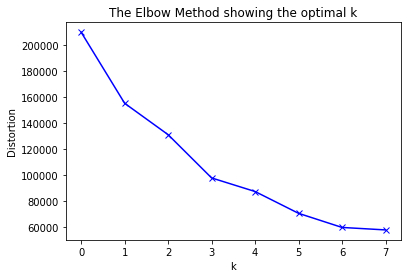

In [25]:
# k means determine k for first matrix 
distortions = []
for k in range(2,10):
    kmeanModel = KMeans(n_clusters=k, init='k-means++').fit(info_matrix)
    kmeanModel.fit(info_matrix)
    distortions.append(sum(np.min(cdist(info_matrix, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / info_matrix.shape[0])

# Plot the elbow
plt.plot( distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The elbow matrix shows that the better number of cluster for the first matrix is 3 (the point where the plot starts the "elbow")

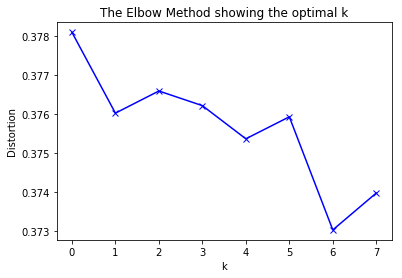

In [26]:
# k means determine k for second matrix
distortions = []
for k in range(2,10):
    kmeanModel = KMeans(n_clusters=k, init='k-means++').fit(matrix_tfidf)
    kmeanModel.fit(matrix_tfidf)
    distortions.append(sum(np.min(cdist(matrix_tfidf, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / matrix_tfidf.shape[0])

# Plot the elbow
plt.plot( distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The elbow matrix shows that for the second matrix the better number of clusters is 4.

In [27]:
# kmeans++ clustering for first matrix with k = 3 (choosen with elbow method)
cluster = sklearn.cluster.KMeans(n_clusters=3, init='k-means++').fit(info_matrix)
labels = cluster.labels_

In [28]:
# kmeans++ clustering for second matrix with k = 4 (choose with elbow method) dal tre inizia a scendere
cluster2 = sklearn.cluster.KMeans(n_clusters=4, init='k-means++').fit(matrix_tfidf)
labels2 = cluster2.labels_

Let's add label column to both matrixs to know the number of cluster for each announcement and for each document

In [29]:
labels_se = pd.Series(labels)
info_matrix['labels'] = labels_se.values
info_matrix.head()

,price,locals,surface,bathroom,floor,labels
0,225000,2,50,1,1,0
1,395000,5,130,2,1,0
2,3700000,5,250,3,5,1
3,850000,5,175,2,5,2
4,279000,3,110,1,1,0


In [30]:
labels2_se = pd.Series(labels2)
matrix_tfidf['labels2'] = labels2_se.values
matrix_tfidf.head()

Word,1,10,100,1000,10000,10001,10002,10003,10004,10005,...,9991,9992,9993,9994,9995,9996,9997,9998,9999,labels2
Document,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
2,0.002863,0.007001,0.034401,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.000000,0.000000,0.000000,0.040129,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
5,0.001597,0.003906,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


## Comparison among cluster

We expect that both datasets will lead to similar clusters. Is this true?

To check this, we use the Jaccard-Similarity to measure the similarity betweeen the two outputs (information clusters vs description clusters). 

Then we will return the 3-most similar couples of clusters.

To calculate jaccard similarity, we use two columns ( label and labels2) that help us to specify, for each row, to which cluster it belongs


In [31]:
sims = {}
for i,label in enumerate(info_matrix['labels']):
    if label not in sims:
        sims[label] = [i+1]
    if label in sims:
        sims[label].append(i+1)
sims2 = {}
for i,label in enumerate(matrix_tfidf['labels2']):
    if label not in sims2:
        sims2[label] = [i+1]
    if label in sims2:
        sims2[label].append(i+1)

In [32]:
keypair= {}
for clust in sims:
    for clust2 in sims2:
        keypair[str(clust),str(clust2)]= len(set.intersection(set(sims[clust]),set(sims2[clust2])))/len(set.union(set(sims[clust]),set(sims2[clust2])))

In [33]:
highest3 = sorted(keypair.values(), reverse = True)[:3]

In [41]:
highest3

[0.6308718052328518, 0.21599394004977815, 0.09956220872758086]

In [34]:
clust3 = []
for key in keypair:
    if keypair[key] in highest3:
        clust3.append(key)

We now display the most similar couples of clusters

In [42]:
clust3

[('0', '3'), ('0', '2'), ('2', '3')]

## Word cloud of house descriptions

To visualize better, we created a worldcloud for each couple of clusters. The words represented are those extrated from the description of the houses that are in the relative couple.


After that, we visualized a general world cloud image to have a clearer idea on the general results.

In [35]:
cloud=[]

for tuple_ in clust3:
    announcements = []
    for i,clust in enumerate(info_matrix['labels']):
        if int(tuple_[0]) == clust:
            announcements.append(i+1)
    for i,clust in enumerate(matrix_tfidf['labels2']):
        if int(tuple_[1]) == clust:
            announcements.append(i+1)
    cloud.append(announcements)


In [36]:
couple_desc = []
for couple in cloud:
    descs = []
    for idx in couple:
        descs.append(cleaned_descriptions[idx])
    couple_desc.append(''.join(descs))

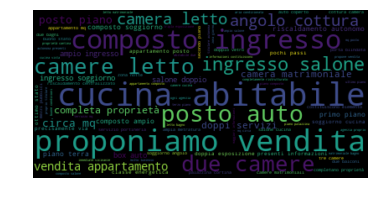

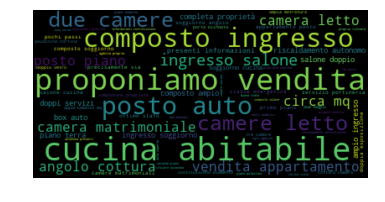

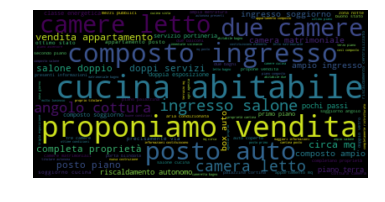

In [37]:
# Create and generate a word cloud image:
for desc in range(len(couple_desc)):
    wordcloud = WordCloud().generate(couple_desc[desc])

# Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [38]:
text=" ".join(i for i in couple_desc)


In [39]:
# Create and generate a word cloud image:
cloudd = np.array(Image.open(r'C:\Users\Giumas\Desktop\logo.png'))
cloudd[cloudd == 0 ] = 255
wc = WordCloud(background_color="white", max_words=2000, mask=cloudd, contour_width=1, contour_color='white')



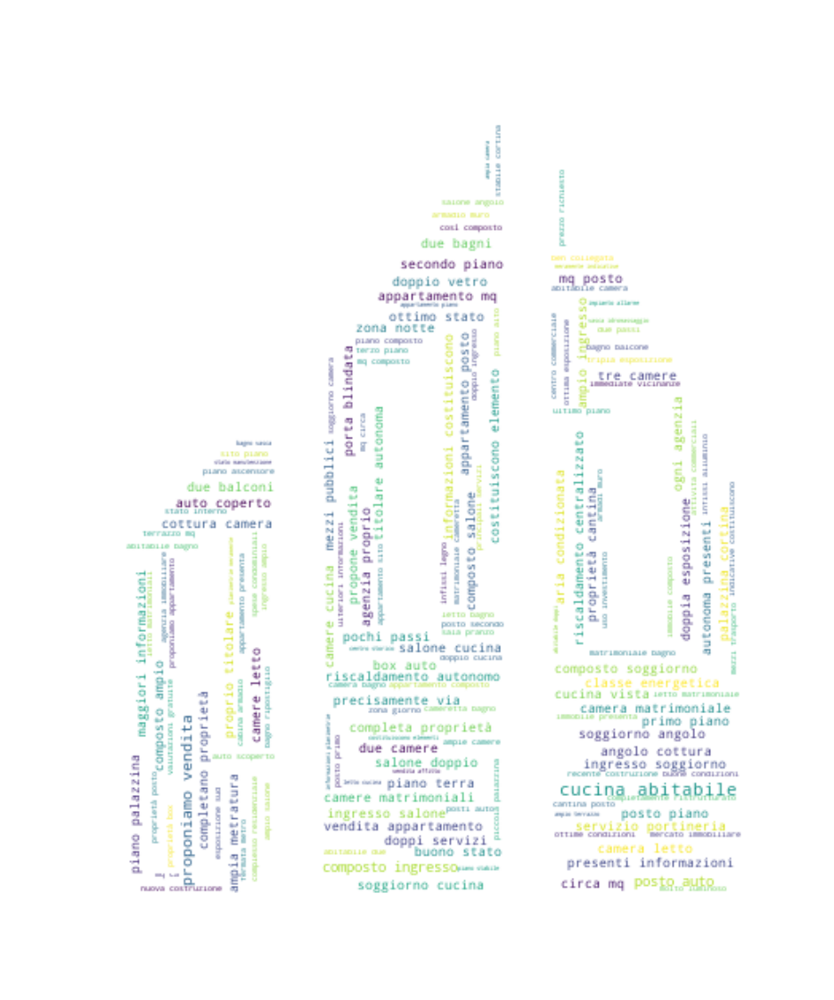

In [40]:
wc.generate(text)
# Display the generated image:
plt.figure(figsize=[40,20])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()